In [1]:
import sys
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib.ticker as mticker
import pandas as pd
import numpy as np
from itertools import compress
from sklearn.decomposition import PCA
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

%config IPCompleter.greedy=True
import keras
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping
from keras import regularizers
from keras.models import load_model
import datetime

#######Ploltly
import chart_studio
import chart_studio.plotly as py
import plotly
import plotly.io as pio
import plotly.offline as pyo
import plotly.figure_factory as ff
from   plotly.tools import FigureFactory as FF, make_subplots
import plotly.graph_objs as go
from   plotly.graph_objs import *
from   plotly import tools
from   plotly.offline import download_plotlyjs, init_notebook_mode, iplot
# pyo.offline.init_notebook_mode()
pyo.init_notebook_mode()
pio.renderers.default='notebook'
import joblib

In [2]:
samples = joblib.load('samples.sav')
list_CpGs = joblib.load('list_CpGs.sav')
# list_patterns = joblib.load('list_patterns.sav')
# list_each_cpg = joblib.load('list_each_cpg.sav')
CpG_positions = joblib.load('CpG_positions.sav')
CpG_num = joblib.load('CpG_num.sav')
colors = joblib.load('colors.sav')
CpG_targets = joblib.load('CpG_targets.sav')

In [3]:
set(samples["Group ID"])

{'CD', 'CL', 'Ctrl', 'DD', 'FD', 'MN', 'MP', 'MU', 'TR'}

In [4]:
sel_group = ['Ctrl', 'FD', 'MN', 'MP']
samples2 = samples.loc[samples["Group ID"].isin(sel_group),]
list_CpGs2 = {}
list_patterns2 = {}
for target in CpG_targets:
    list_CpGs2[target] = list_CpGs[target].loc[list_CpGs[target]["group"].isin(sel_group),]
#     list_patterns2[target] = list_patterns[target].loc[list_patterns[target]["group"].isin(sel_group),]

In [4]:
# no_ids = []
# for j, l in enumerate(samples2["ID"]):
#     for i, target in enumerate(CpG_targets):
#         print(".", end="")
#         d = sum(list_CpGs2[target]["id"]==l)
#         if d < 50:
#             no_ids.append(l)
# print(no_ids)
# for l in no_ids:
#     samples2 = samples2.loc[samples2["ID"] != l,]

....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................['Ctrl_CO', 'FD_24a', 'MN_59d', 'MP_56f', 'MP_59b']


In [5]:
training_ratio = 0.7
ss = samples2.loc[samples2["Group ID"].isin(['Ctrl']),]
training_set = ss.sample(frac=training_ratio, random_state=11).ID.values.tolist()
validation_set = list(set(ss.ID.values.tolist()) - set(training_set))
# print(training_set)
# print(validation_set)
samples2.loc[samples2["ID"].isin(training_set),"Group ID"] = "Training"
# print(samples)
for target in CpG_targets:
    print(target, end="")
    for idd in training_set:
        print(".", end="")
        list_CpGs2[target].loc[list_CpGs2[target]["id"]==idd,"group"] = "Training"
#         list_patterns2[target].loc[list_patterns2[target]["id"]==idd,"group"] = "Training"


cg15289427...........................................cg22797031...........................................cg27630153...........................................cg19586199...........................................

In [5]:

for target in CpG_targets:
#     list_CpGs[target].iloc[:,3:] = list_CpGs[target].iloc[:,3:] -1
#     list_CpGs2[target].iloc[:,3:] = list_CpGs2[target].iloc[:,3:].replace(1, 2)
    list_CpGs2[target].iloc[:,3:] = list_CpGs2[target].iloc[:,3:].replace(0, -1)
#     list_CpGs2[target].iloc[:,3:] = list_CpGs2[target].iloc[:,3:]
#     list_CpGs[target].iloc[:,3:]
#     list_CpGs2[target].iloc[:,3:]

In [6]:
# list_CpGs2["cg15289427"].iloc[:,3:].sample(n=10)
joblib.dump(samples2, 'final_samples_list.sav')
joblib.dump(list_CpGs2, 'final_list_CpGs.sav')


['final_list_CpGs.sav']

In [6]:
samples2 = joblib.load('final_samples_list.sav')
list_CpGs2 = joblib.load('final_list_CpGs.sav')

In [4]:
samples2.to_excel("final_samples.xlsx")

In [7]:
def pred_model(m, data):
    predictions = m.predict(data)
    mse = np.mean(np.power(data - predictions, 2), axis=1)
    return mse

def train_validation_loss(df_history, title):
    """Model train-vs-validation loss"""
    pyo.init_notebook_mode()
    trace = []
    for label, loss in zip(['Train', 'Validation'], ['loss', 'val_loss']):
        trace0 = {'type' : 'scatter', 
                  'x'    : df_history.index.tolist(),
                  'y'    : df_history[loss].tolist(),
                  'name' : label,
                  'mode' : 'lines'
                  }
        trace.append(trace0)
    data = trace
    layout = {'title' : title, 'titlefont':{'size' : 30},
              'xaxis' : {'title':  '<b> Epochs', 'titlefont':{ 'size' : 25}},
              'yaxis' : {'title':  '<b> Loss', 'titlefont':{ 'size' : 25}},
              }
    fig = go.Figure(data = data, layout = layout)
#     pyo.write_image(fig, '/projects/AML/scripts/figures/training/training_'+target+'.pdf')
    
    
    fig.show()
#     return
#     return pyo.iplot(fig)

def build_model(X):
    data = np.asarray(X)
#     np.random.shuffle(data)
    ###### Set up Neurons ##########################
    # No of Neurons in each Layer [6,3,2,3,6]
    input_dim = data.shape[1]

    input_layer = Input(shape=(input_dim, ))
    encoder = Dense(input_dim, activation="tanh",
                    activity_regularizer=regularizers.l1(10e-5))(input_layer)

    encoder = Dense(8, activation="tanh")(encoder)
#         encoder = Dense(5, activation="tanh")(encoder)
#         encoder = Dense(10, activation="tanh")(encoder)
    decoder = Dense(3, activation='tanh')(encoder)
    decoder = Dense(8, activation='tanh')(decoder)

    decoder = Dense(input_dim, activation='tanh')(decoder)
    model = Model(inputs=input_layer, outputs=decoder)
    model.compile(optimizer='adam', loss='mse' )
#     model.compile(optimizer='adam', loss='binary_crossentropy' )
    
    return model

def save_fullmodels(model, filename):
    # serialize model to JSON
    model_json = model.to_json()
    with open(filename+".json", "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights(filename+".h5") 


def load_fullmodel(filename):
    # load json and create model
    json_file = open(filename+'.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    # load weights into new model
    loaded_model.load_weights(filename+".h5")
    return loaded_model
 

In [10]:
nb_epoch = 100
batch_size = 100
n_clusters = 1
threshold_persentile = 95

cg15289427
Training on Cluster 0	1.00	(417389, 14)
Time to run the model: 0:01:22.673193.


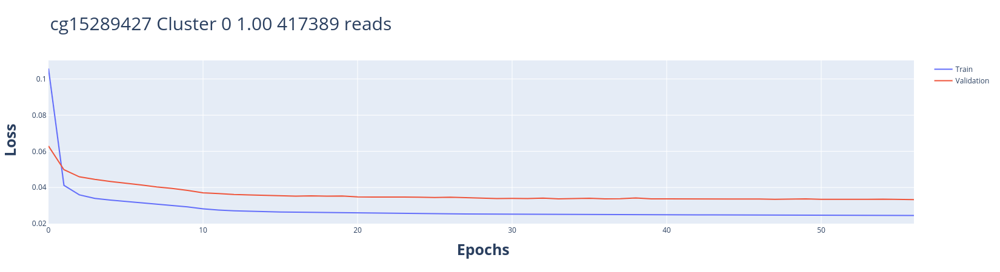

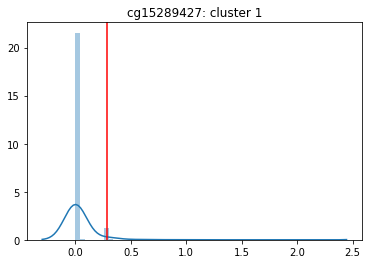

cg22797031
Training on Cluster 0	1.00	(1711339, 10)
Time to run the model: 0:06:25.207412.


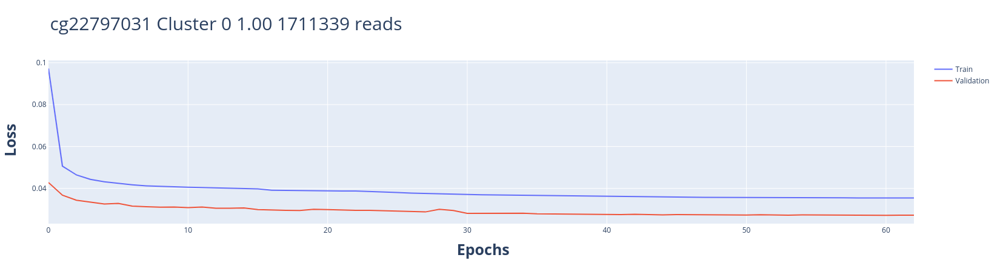

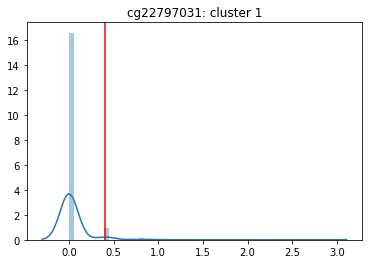

cg27630153
Training on Cluster 0	1.00	(2390477, 15)
Time to run the model: 0:13:50.259139.


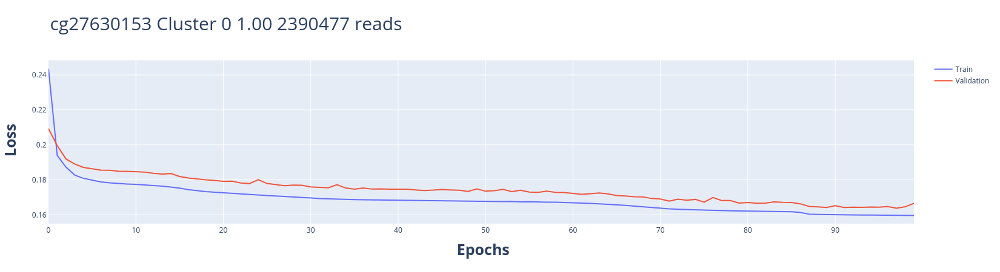

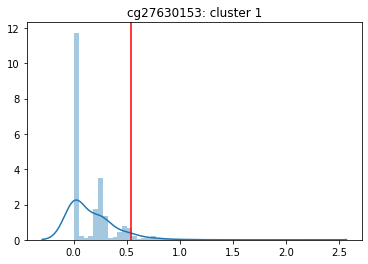

cg19586199
Training on Cluster 0	1.00	(2728995, 9)
Time to run the model: 0:05:11.581664.


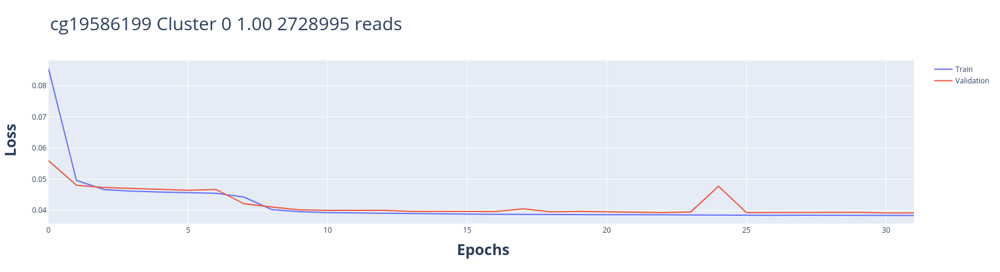

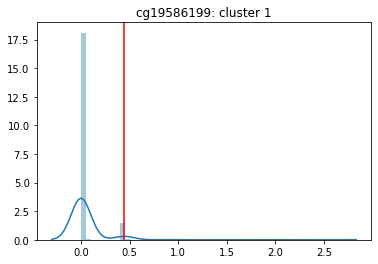

['treshold_loss.sav']

In [12]:
es = EarlyStopping(monitor='loss', mode='min', min_delta=0.001, patience=20, restore_best_weights=True)

models = {}
propor = {}
treshold_loss = {}

for i, target in enumerate(CpG_targets):
    models[target] = {}
    propor[target] = {}
    treshold_loss[target] = {}
    print(target)
    tab = list_CpGs2[target]
    X_train = tab.loc[tab["group"]=="Training",].iloc[:,3:]
    #X_train = X_train.sample(n = 10000)
    total_reads = len(X_train)
    kmeans = KMeans(n_clusters=n_clusters, random_state=11).fit(X_train)
#     print(len(kmeans.labels_))
#     sys.exit()
#     clusterer = hdbscan.HDBSCAN()
#     clusterer.fit(X_train)
#     print(len(clusterer.labels_))
#     print(clusterer.labels_.max())
#     print(clusterer.labels_)
    for k in range(n_clusters):
        
        propor[target][k] = len([x for x in kmeans.labels_ if x==k])/total_reads
        t_ini = datetime.datetime.now()
        
        data = np.asarray(X_train.loc[kmeans.labels_==k], dtype=np.float32)
        print("\t".join(["Training on Cluster "+str(k), "{:.2f}".format(propor[target][k]), str(data.shape)]))
#         print(data[0:5])
        models[target][k] = build_model(data)
#        models[target][k] = build_model(data)
        save_fullmodels(models[target][k], "_".join(["model", target, "cluster", str(n_clusters), str(k)]))
#         models[target][k].save("_".join(["model", target, "cluster", str(n_clusters), str(k),".h5"]))
    #     autoencoder.summary()

        history = models[target][k].fit(data, data, epochs=nb_epoch, batch_size=batch_size,
                          shuffle=True, validation_split=0.3, verbose=0,
                          callbacks=[es])
        #calcualte loss
        t_fin = datetime.datetime.now()
        print('Time to run the model: {}.'.format(str(t_fin - t_ini)))
        df_history = pd.DataFrame(history.history)
        train_validation_loss(df_history, target+" Cluster "+str(k)+" "+"{:.2f}".format(propor[target][k])+" "+str(data.shape[0])+" reads")
        loss = pred_model(models[target][k], data)
        
#        print(loss)
#        print(max(loss))
#        print(np.percentile(loss, 99.9999999))
#        sys.exit()
#         treshold_loss[target][k] = max(loss)
        treshold_loss[target][k] = np.percentile(pred_model(models[target][k], data), threshold_persentile)
        ax = sns.distplot(loss,kde_kws={'bw':0.1})
        plt.title(target+": cluster "+str(k+1))
        plt.axvline(treshold_loss[target][k], color='red')
        plt.show()
#        print([max(pred_model(model, data)), treshold_loss[target][k]])
        
joblib.dump(treshold_loss, 'treshold_loss.sav')

In [11]:
from keras.models import model_from_json
loss_dict = {}
cluster_list = {}

max_c_group = 200

for i, target in enumerate(CpG_targets):
    print("***** "+target)
    loss_dict[target] = {}
    cluster_list[target] = {}
    count = {'FD':max_c_group, 'Ctrl':max_c_group, 'MN':max_c_group, 'MP':max_c_group, "Training":max_c_group}
    ###### Prediction ##################################
    for j, l in enumerate(samples2["ID"]):
        g = samples2.loc[samples2["ID"]==l,"Group ID"].values[0]
        if g in ['FD', 'Ctrl', 'MN', 'MP', "Training"] and count[g] > 0:
            count[g] -= 1
            print(l, end="")
            t_ini = datetime.datetime.now()
            loss_dict[target][l] = {}

            d = list_CpGs2[target].loc[list_CpGs2[target]["id"]==l,].iloc[:,3:]
            total = d.shape[0]
            ind_cluster = pd.DataFrame([-1] * total, columns = ["cluster"])

            for k in range(n_clusters):
                print(".", end="")
                # Get reads with -1 index
                sel = ind_cluster["cluster"] == -1
                sel = sel.values
                dd = d.loc[sel,:]
                # Calculate loss function
#                 m = load_model("_".join(["model", target, "cluster", str(n_clusters), str(k),".h5"]))
#                 loss_dict[target][l][k] = pred_model(m, dd.to_numpy(dtype=np.float32))

                model = load_fullmodel("_".join(["model", target, "cluster", str(n_clusters), str(k)]))
                loss_dict[target][l][k] = pred_model(model, dd.to_numpy(dtype=np.float32))

        #                 loss_dict[target][l][k] = pred_model(models[target][k], dd.to_numpy(dtype=np.float32))
                #print(loss_dict[target][l][k])
                #print(treshold_loss[target][k])
                #sys.exit()
                # Proportion of loss function below the threshold
                
#                 ax = sns.distplot(loss_dict[target][l][k],kde_kws={'bw':0.1})
#                 plt.axvline(treshold_loss[target][k], color='red')
#                 plt.title(target+": cluster "+str(k+1)+", "+l)
#                 plt.show()

                p_kn = len([x for x in loss_dict[target][l][k] if x < treshold_loss[target][k]])
                p_k = p_kn/total
#                 print(p_k)
                # Proportion > training proportion
                if p_k > propor[target][k]:
#                     print("case 1")
    #                 print(loss_dict[target][l][k][:10])
    #                 print(loss_dict[target][l][k][:10].argsort())
    #                 print(loss_dict[target][l][k][:10].argsort()[:int(propor[target][k]*total)])
                    ind_min = loss_dict[target][l][k].argsort()[:int(propor[target][k]*total)].tolist()
                    sel_top = [list(compress(list(ind_cluster.index), sel.tolist()))[x] for x in ind_min]
    #                 print(sel_top)
    #         .iloc
                    ind_cluster["cluster"].iloc[sel_top] = k
    #                 print(ind_cluster["cluster"].value_counts())

                # Proportion < training proportion
                else:
#                     print("case 2")
    #                 print(p_kn)
    #                 print(p_k)
    #                 print(propor[target][k])
    #                 print(treshold_loss[target][k])
    #                 print(loss_dict[target][l][k])
    #                 print(loss_dict[target][l][k].argsort())
    #                 print(loss_dict[target][l][k].argsort()[:p_kn])
                    # Select normal reads
                    ind_min = loss_dict[target][l][k].argsort()[:int(p_k*total)].tolist()
    #                 print(loss_dict[target][l][k][ind_min])
                    sel_top = [list(compress(list(ind_cluster.index), sel.tolist()))[x] for x in ind_min]
                    ind_cluster["cluster"].iloc[sel_top] = k
#                 print(k)
#                 print(p_kn)
#                 print(p_k)
#                 print(propor[target][k])
#                 print([p_k, propor[target][k]])
#             print()
#             print(ind_cluster["cluster"].value_counts())
            cluster_list[target][l] = ind_cluster
            t_end = datetime.datetime.now()
            print(str(t_end - t_ini))
#             print('{}.'.format((t_end - t_ini).timedelta()))


***** cg15289427
FD_11a.

NameError: name 'treshold_loss' is not defined

In [10]:
# Extract anomaly ratio
sample_id = []
target_list = []
anomaly_count = []
anomaly_ratio = []
clusters = []
groups = []

for i, target in enumerate(CpG_targets):
    for j, l in enumerate(samples2["ID"]):
        if l in cluster_list[target].keys():
            
            dd = cluster_list[target][l]["cluster"].value_counts().to_dict()
            total_reads = sum(dd.values())
#             print(total_reads)
            for k in range(-1, n_clusters):
#                 print(k)
                sample_id.append(l)
                target_list.append(target)
#                 print(cluster_list[target][l]["cluster"].value_counts())
                
#                 print(dd)
#                 print(dd[k])
                if k in list(dd.keys()):
                    anomaly_count.append(dd[k])
                    anomaly_ratio.append(dd[k]/total_reads)
                else:
                    anomaly_count.append(0)
                    anomaly_ratio.append(0)
                clusters.append(k)
                groups.append(samples2.loc[samples2["ID"]==l,"Group ID"].values[0])
sum_data = pd.DataFrame({'sample': sample_id,
                         'target': target_list,
                         'anomaly': anomaly_count,
                         'anomaly_ratio': anomaly_ratio,
                         'cluster': clusters,
                         'group': groups})

joblib.dump(sum_data, str(n_clusters)+'_cluster_sum_data.sav')

['1_cluster_sum_data.sav']

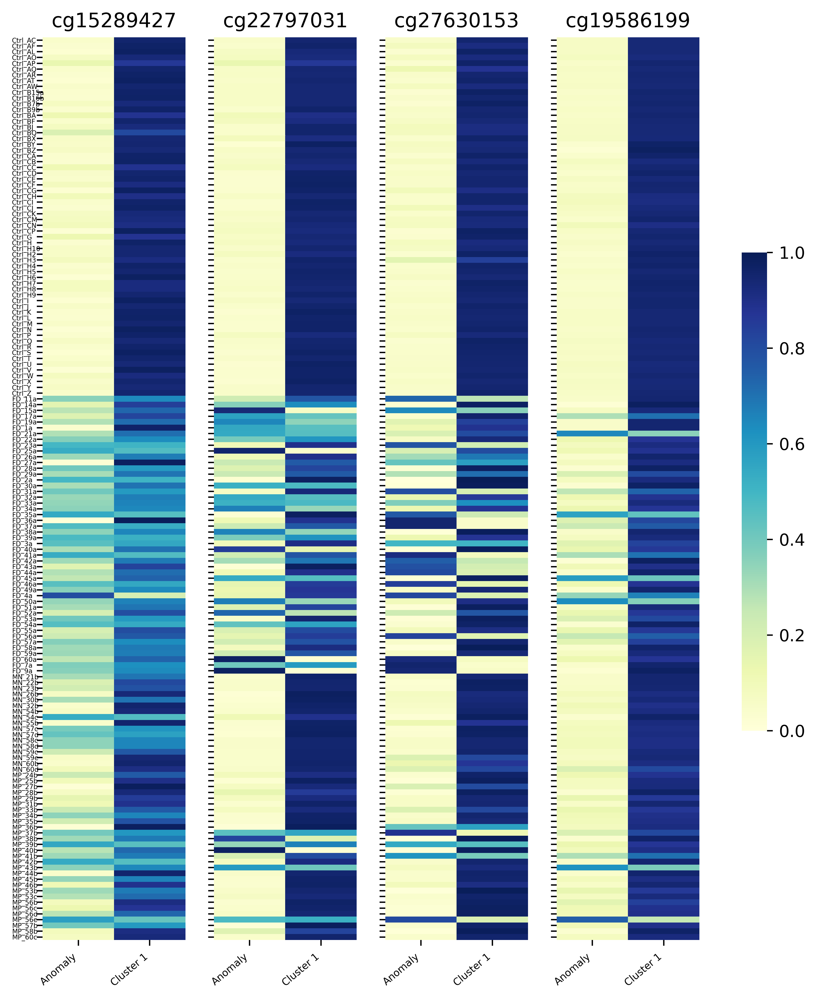

In [11]:
# Here we create a figure instance, and two subplots
fig = plt.figure(figsize = (7.09,10), dpi=500) # width x height
cbar_ax = fig.add_axes([.95, .3, .03, .4])

for i, target in enumerate(CpG_targets):
    ax = fig.add_subplot(1, len(CpG_targets), i+1)
    heatmapdata = pd.pivot_table(sum_data.loc[sum_data["target"]==target,],
                                 index='sample', columns='cluster', values='anomaly_ratio')
    sns.heatmap(heatmapdata, cmap="YlGnBu", ax=ax, cbar=i==len(CpG_targets)-1, cbar_ax=cbar_ax, 
                vmin=0, vmax=1, xticklabels=True, yticklabels=True)
    ax.set_title(target)
    ax.set_ylabel('')    
    ax.set_xlabel('')
    if i == 0:
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, size = 4, ha = 'left')
        yax = ax.get_yaxis()
        pad = 15
        yax.set_tick_params(pad=pad)
    else:
        ax.set_yticklabels([], [])
    ax.set_xticklabels(["Anomaly", "Cluster 1", "Cluster 2", "Cluster 3", "Cluster 4", "Cluster 5"], rotation=40, size = 6, ha="right")
    
    
#     plt.draw()

#     plt.tight_layout()
fig.savefig("/home/joseph/Dropbox/Work/Manuscripts/2020_Kuo_Leukemia/figures/Fig_autoencorder_"+str(n_clusters)+"clusters.png", bbox_inches='tight')
# plt.tight_layout()
plt.show()


In [12]:
## Histogram
anomaly = {}
glist = CpG_targets
for target in glist:
    t = sum_data.loc[sum_data["target"]==target,]
    a = t.loc[t["cluster"]==-1, ["anomaly_ratio", "sample", "group"]]
    anomaly[target] = a.set_index('sample')

df_concat = pd.concat(tuple([anomaly[g] for g in glist]))
anomaly["Mean"] = df_concat.groupby(['sample', 'group']).mean().reset_index()

for target in glist:
# anomaly["Mean"] = anomaly["Mean"].set_index('sample')
    anomaly[target] = anomaly[target].reindex(index=anomaly["Mean"]['sample'])
    anomaly[target] = anomaly[target].reset_index()

In [13]:
anomaly["Mean"].to_csv("/home/joseph/Dropbox/Work/Manuscripts/2020_Kuo_Leukemia/figures/autoencoder_"+str(n_clusters)+"cluster.csv")

In [14]:
anomaly["cg15289427"]

,sample,anomaly_ratio,group
0,Ctrl_AC,0.046311,Training
1,Ctrl_AF,0.032688,Training
2,Ctrl_AL,0.024386,Training
3,Ctrl_AO,0.067251,Training
4,Ctrl_AP,0.138691,Ctrl
...,...,...,...
151,MP_56d,0.269841,MP
152,MP_56e,0.574899,MP
153,MP_57b,0.404645,MP
154,MP_58b,0.086396,MP


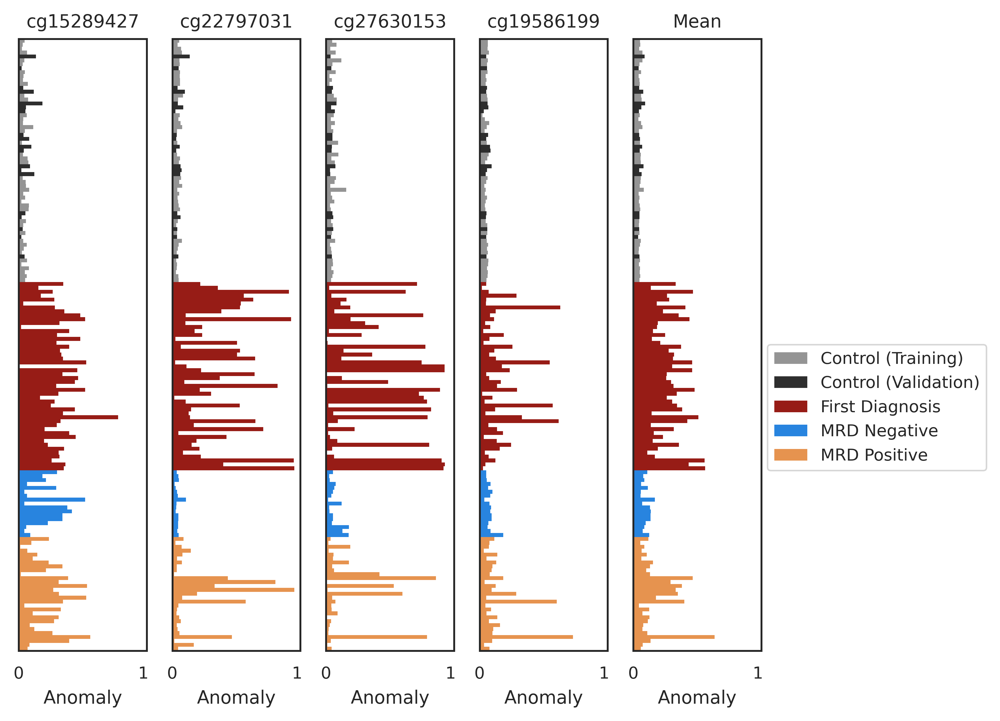

In [15]:
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_height()
        diff = current_width - new_value
        # we change the bar width
        patch.set_height(new_value)
        # we recenter the bar
        patch.set_y(patch.get_y() + diff * .5)
#         patch.set_y(int(patch.get_y()))

sns.set()
sns.set_style("white")
sns.set_context("paper")
# sns.set(font_scale=3)

####### Figures #########
f_target = list(anomaly.keys())
f, axs = plt.subplots(1, len(f_target), figsize=(7.09, 6), 
                      sharex=True, sharey=True, dpi=500)
for i, target in enumerate(f_target):
    
    sns.barplot(y="sample", x="anomaly_ratio", data=anomaly[target],linewidth=0,
                ax=axs[i], hue="group", dodge=False, palette=colors) 
    change_width(axs[i],1)
    axs[i].set(ylabel='')
    axs[i].set_title(target)
    axs[i].get_legend().remove()
#     if i == 0:
#         axs[i].axvline(threshold, linewidth=4, color='gray')
#     if i > 0:
    axs[i].set_yticks([])

    if i == 4:
        handles, labels = axs[i].get_legend_handles_labels()
        axs[i].legend(bbox_to_anchor=(1.05, 0.5), loc=2, borderaxespad=0., handles= handles, labels=["Control (Training)", "Control (Validation)", "First Diagnosis",
                              "MRD Negative", "MRD Positive"])
#         axs[i].legend()
#         axs[i].set(xlabel='Proportion of anomaly')
#     else:
#         axs[i].set(xlabel='')
    axs[i].set(xlabel='Anomaly')
    
#     plt.tight_layout(h_pad=0.1)
#         plt.grid(True, which="both",ls="--", c='gray')  

#         locmin = mticker.LogLocator(base=10, subs=np.arange(0.1,1,0.1),numticks=10)  
#         axs[i].yaxis.set_minor_locator(locmin)
#         axs[i].yaxis.set_minor_formatter(mticker.NullFormatter())

f.savefig("/home/joseph/Dropbox/Work/Manuscripts/2020_Kuo_Leukemia/figures/Fig_prediction_hist_"+str(n_clusters)+".pdf", bbox_inches='tight')
plt.show()

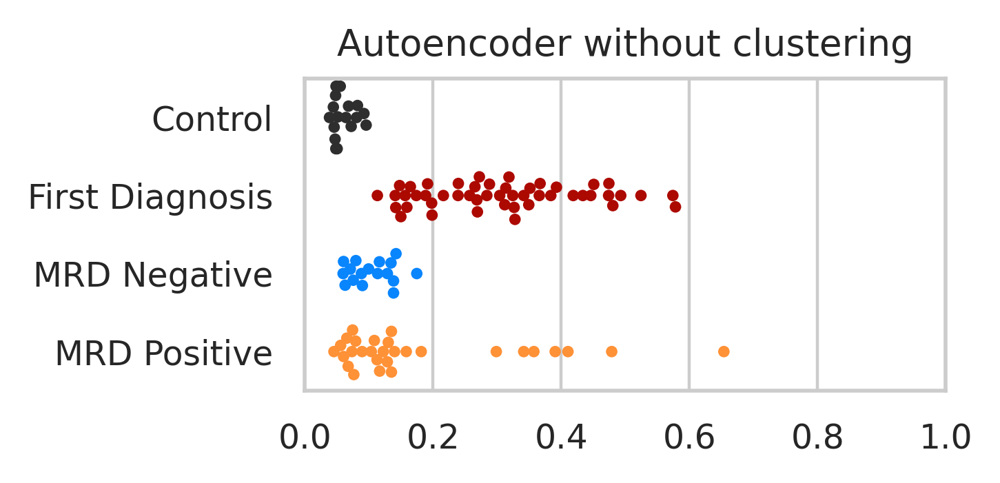

In [16]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("paper")

####### Figures #########
f, axs = plt.subplots(1, 1, figsize=(3, 1.5), dpi=400)
# sns.boxplot(x="group", y="anomaly_ratio", data=anomaly["Mean"],
#             ax=axs, hue="group", palette=colors, dodge=False, showfliers = False)
sns.swarmplot(y="group", x="anomaly_ratio", data=anomaly["Mean"],
              ax=axs, hue="group", palette=colors, dodge=False, color=".25", size=3,
              order=["Ctrl", "FD", "MN", "MP"])
axs.set_title("Autoencoder without clustering")
axs.set_xlim([0,1])
axs.set(xlabel='')
axs.set(ylabel='')
axs.set_yticklabels(["Control", "First Diagnosis","MRD Negative", "MRD Positive"], rotation=0, ha='right')
axs.get_legend().remove()

# handles, labels = axs.get_legend_handles_labels()
# axs.legend(title='', loc=2,
#            handles= handles, labels=["Control (Training)", "Control (Validation)", "First Diagnosis",
#                               "MRD Negative", "MRD Positive"])
f.savefig("/home/joseph/Dropbox/Work/Manuscripts/2020_Kuo_Leukemia/figures/autoencoder_"+str(n_clusters)+".png", bbox_inches='tight', dpi=600)
plt.show()

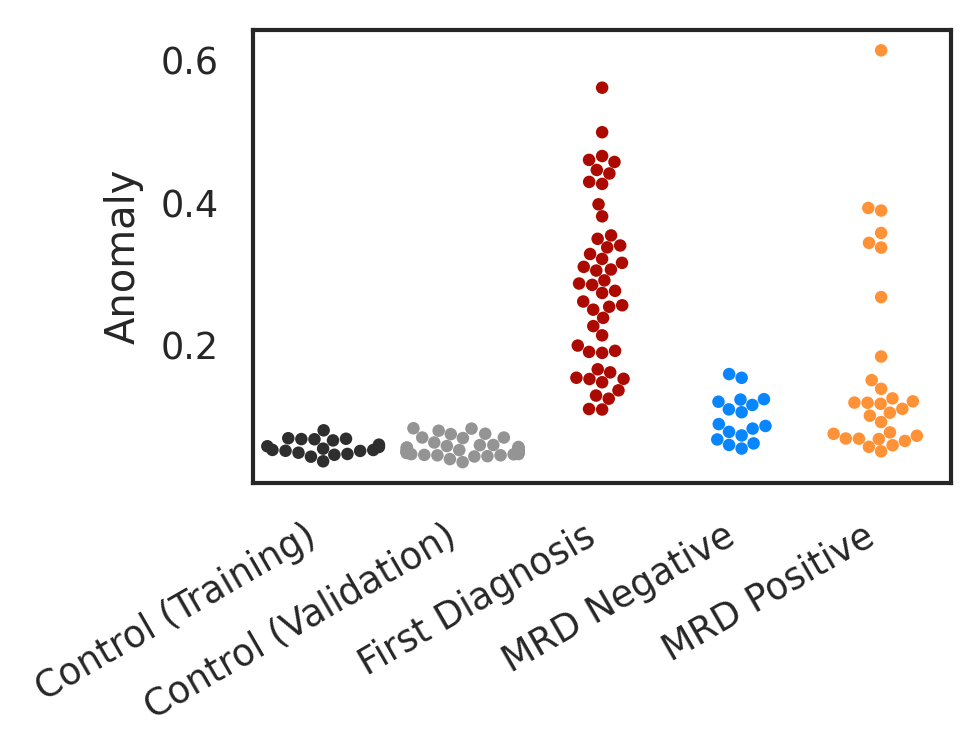

In [15]:
sns.set()
sns.set_style("white")
sns.set_context("paper")


####### Figures #########
f, axs = plt.subplots(1, 1, figsize=(3, 2), dpi=300)
# sns.boxplot(x="group", y="anomaly_ratio", data=anomaly["Mean"],
#             ax=axs, hue="group", palette=colors, dodge=False, showfliers = False)
sns.swarmplot(x="group", y="anomaly_ratio", data=anomaly["Mean"],
              ax=axs, hue="group", palette=colors, dodge=False, color=".25", size=3)

axs.set(ylabel='Anomaly')
axs.set(xlabel='')
axs.set_xticklabels(["Control (Training)", "Control (Validation)", "First Diagnosis",
                              "MRD Negative", "MRD Positive"], rotation=30, ha='right')
axs.get_legend().remove()
# handles, labels = axs.get_legend_handles_labels()
# axs.legend(title='', loc=2,
#            handles= handles, labels=["Control (Training)", "Control (Validation)", "First Diagnosis",
#                               "MRD Negative", "MRD Positive"])
f.savefig("/home/joseph/SynologyDrive/hist.pdf", bbox_inches='tight')
plt.show()

In [16]:
threshold = anomaly["Mean"].loc[anomaly["Mean"]["group"]=="Training","anomaly_ratio"].quantile(.99) * 1.1

In [121]:
threshold

0.026331356971769655

In [17]:
# cm = pd.DataFrame(index = ["Control (Training)", "Control (Validation)", "First Diagnosis", "MRD Negative", "MRD Positive"],
#                   columns = ["Prediction with anomaly leukemia cells", "Prediction healthy"])
cm = pd.DataFrame(index = ["Training", "Validation", "FD", "MN", "MP"],
                  columns = ["abnormal", "normal"])

ratios = anomaly["Mean"].loc[anomaly["Mean"]["group"]=="Training","anomaly_ratio"].values
cm.loc["Training", "normal"] = sum(ratios < threshold)
cm.loc["Training", "abnormal"] = sum(ratios >= threshold)

ratios = anomaly["Mean"].loc[anomaly["Mean"]["group"]=="Ctrl","anomaly_ratio"].values
cm.loc["Validation", "normal"] = sum(ratios < threshold)
cm.loc["Validation", "abnormal"] = sum(ratios >= threshold)

ratios = anomaly["Mean"].loc[anomaly["Mean"]["group"]=="FD","anomaly_ratio"].values
cm.loc["FD", "normal"] = sum(ratios < threshold)
cm.loc["FD", "abnormal"] = sum(ratios >= threshold)

ratios = anomaly["Mean"].loc[anomaly["Mean"]["group"]=="MN","anomaly_ratio"].values
cm.loc["MN", "normal"] = sum(ratios < threshold)
cm.loc["MN", "abnormal"] = sum(ratios >= threshold)

ratios = anomaly["Mean"].loc[anomaly["Mean"]["group"]=="MP","anomaly_ratio"].values
cm.loc["MP", "normal"] = sum(ratios < threshold)
cm.loc["MP", "abnormal"] = sum(ratios >= threshold)

sumrow = cm["abnormal"] + cm["normal"]
cm["abnormal"] = cm["abnormal"]/sumrow
cm["normal"] = cm["normal"]/sumrow

In [123]:
cm

,abnormal,normal
Training,0,1
Validation,0.04,0.96
FD,0.836735,0.163265
MN,0.111111,0.888889
MP,0.483871,0.516129


Text(0.5, -19.416666666666664, 'Prediction')

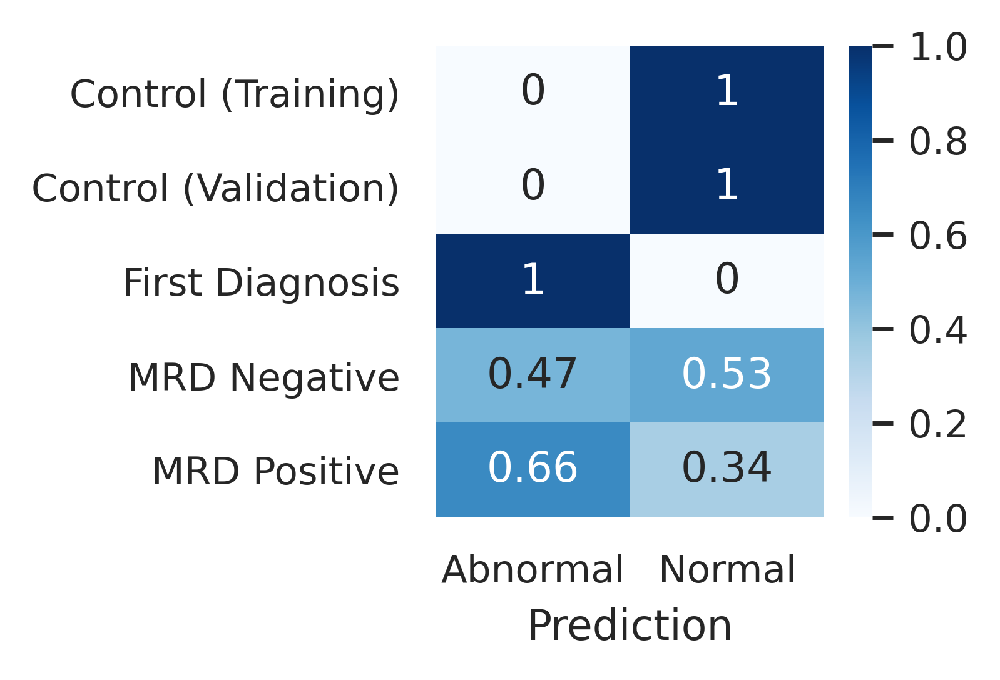

In [18]:
plt.figure(figsize=(2, 2), dpi=500)
hm = sns.heatmap(cm.to_numpy(dtype=np.float64), annot=True, cmap=plt.cm.Blues)
locs, labels = hm.get_xticks()
hm.set_yticklabels(["Control (Training)", 
                    "Control (Validation)", 
                    "First Diagnosis", 
                    "MRD Negative", 
                    "MRD Positive"], 
                   rotation=0)
hm.set_xticklabels(["Abnormal", "Normal"], rotation=0)
hm.set_xlabel("Prediction")

In [ ]:
ss = joblib.load('samples.sav')
list_CpGs = joblib.load('list_CpGs.sav')
sel_group = ['Ctrl', 'FD', 'MN', 'MP', "MU", "Training"]
samples3 = ss.loc[~ss["Group ID"].isin(sel_group),]
list_CpGs3 = {}
# list_patterns3 = {}
for target in CpG_targets:
    list_CpGs3[target] = list_CpGs[target].loc[~list_CpGs[target]["group"].isin(sel_group),]

In [35]:
print(samples3["Group"].to_string())

0                          Cell dilution assay
1                          Cell dilution assay
2                          Cell dilution assay
3                          Cell dilution assay
4                          Cell dilution assay
5                          Cell dilution assay
6                          Cell dilution assay
7                          Cell dilution assay
8                          Cell dilution assay
9                                    Cell line
10                                   Cell line
11                                   Cell line
12                                   Cell line
13                                   Cell line
14                                   Cell line
78                          DNA dilution assay
79                          DNA dilution assay
80                          DNA dilution assay
81                          DNA dilution assay
82                          DNA dilution assay
83                          DNA dilution assay
84           

In [23]:
from keras.models import model_from_json
loss_dict2 = {}
cluster_list2 = {}

for i, target in enumerate(CpG_targets):
    print("***** "+target)
    loss_dict2[target] = {}
    cluster_list2[target] = {}
    ###### Prediction ##################################
    for j, l in enumerate(samples3["ID"]):
        g = samples3.loc[samples3["ID"]==l,"Group ID"].values[0]
        
        print(l, end="")
        t_ini = datetime.datetime.now()
        loss_dict2[target][l] = {}

        d = list_CpGs3[target].loc[list_CpGs3[target]["id"]==l,].iloc[:,3:]
        total = d.shape[0]
        ind_cluster = pd.DataFrame([-1] * total, columns = ["cluster"])

        for k in range(n_clusters):
            print(".", end="")
            # Get reads with -1 index
            sel = ind_cluster["cluster"] == -1
            sel = sel.values
            dd = d.loc[sel,:]
            # Calculate loss function
            loss_dict2[target][l][k] = pred_model(models[target][k], dd.to_numpy(dtype=np.float32))
            
            # Proportion of loss function below the threshold

#                 ax = sns.distplot(loss_dict[target][l][k],kde_kws={'bw':0.1})
#                 plt.axvline(treshold_loss[target][k], color='red')
#                 plt.title(target+": cluster "+str(k+1)+", "+l)
#                 plt.show()

            p_kn = len([x for x in loss_dict2[target][l][k] if x < treshold_loss[target][k]])
            p_k = p_kn/total
            # Proportion > training proportion
            if p_k > propor[target][k]:
                ind_min = loss_dict2[target][l][k].argsort()[:int(propor[target][k]*total)].tolist()
                sel_top = [list(compress(list(ind_cluster.index), sel.tolist()))[x] for x in ind_min]
                ind_cluster["cluster"].iloc[sel_top] = k
            # Proportion < training proportion
            else:
                # Select normal reads
                ind_min = loss_dict2[target][l][k].argsort()[:int(p_k*total)].tolist()
#                 print(loss_dict[target][l][k][ind_min])
                sel_top = [list(compress(list(ind_cluster.index), sel.tolist()))[x] for x in ind_min]
                ind_cluster["cluster"].iloc[sel_top] = k
        cluster_list2[target][l] = ind_cluster
        t_end = datetime.datetime.now()
        print(str(t_end - t_ini))


***** cg15289427
Ctrl_BX.0:00:00.386293
Ctrl_BY.0:00:00.577448
Ctrl_BZ.0:00:00.339181
Ctrl_CA.0:00:00.393807
Ctrl_CC.0:00:00.181819
Ctrl_CD.0:00:00.314630
Ctrl_CF.0:00:00.065685
Ctrl_CG.0:00:00.073253
Ctrl_CH.0:00:00.099374
Ctrl_CI.0:00:00.414781
Ctrl_CM.0:00:00.088860
Ctrl_CN.0:00:00.099732
Ctrl_AL.0:00:31.383655
Ctrl_AO.0:00:46.429695
Ctrl_AP.0:00:03.538759
Ctrl_AQ.0:00:16.894029
Ctrl_AR.0:00:28.208425
Ctrl_BA.0:00:45.112537
Ctrl_BQ.0:00:31.873652
Ctrl_Q.0:00:01.465402
Ctrl_R.0:00:07.848751
Ctrl_V.0:00:12.604139
Ctrl_W.0:00:06.829359
Ctrl_X.0:00:04.550210
Ctrl_Y.0:00:05.720092
Ctrl_Z.0:00:16.660119
Ctrl_B15a.0:00:00.737725
Ctrl_B16b.0:00:04.896372
Ctrl_B7b.0:00:00.215565
Ctrl_B9b.0:00:12.218832
Ctrl_H10.0:01:44.370388
Ctrl_H2.0:00:12.643956
Ctrl_H4.0:01:04.427045
Ctrl_H6.0:00:02.341555
Ctrl_H7.0:00:10.633055
Ctrl_H8.0:01:44.383954
Ctrl_H9.0:02:38.538526
Ctrl_J.0:00:07.524928
Ctrl_K.0:00:02.247138
Ctrl_L.0:00:15.705788
Ctrl_M.0:00:04.528813
Ctrl_N.0:00:14.757582
Ctrl_P.0:00:07.687027


In [ ]:
# Extract anomaly ratio
sample_id = []
target_list = []
anomaly_count = []
anomaly_ratio = []
clusters = []
groups = []

for i, target in enumerate(CpG_targets):
    for j, l in enumerate(samples3["ID"]):
        if l in cluster_list2[target].keys():
            
            dd = cluster_list2[target][l]["cluster"].value_counts().to_dict()
            total_reads = sum(dd.values())
#             print(total_reads)
            for k in range(-1, n_clusters):
#                 print(k)
                sample_id.append(l)
                target_list.append(target)
#                 print(cluster_list[target][l]["cluster"].value_counts())
                
#                 print(dd)
#                 print(dd[k])
                if k in list(dd.keys()):
                    anomaly_count.append(dd[k])
                    anomaly_ratio.append(dd[k]/total_reads)
                else:
                    anomaly_count.append(0)
                    anomaly_ratio.append(0)
                clusters.append(k)
                groups.append(samples3.loc[samples3["ID"]==l,"Group ID"].values[0])
sum_data2 = pd.DataFrame({'sample': sample_id,
                         'target': target_list,
                         'anomaly': anomaly_count,
                         'anomaly_ratio': anomaly_ratio,
                         'cluster': clusters,
                         'group': groups})

joblib.dump(sum_data2, str(n_clusters)+'_cluster_sum_data2.sav')

In [ ]:
# Here we create a figure instance, and two subplots
fig = plt.figure(figsize = (7.09,10), dpi=500) # width x height
cbar_ax = fig.add_axes([.95, .3, .03, .4])

for i, target in enumerate(CpG_targets):
    ax = fig.add_subplot(1, len(CpG_targets), i+1)
    heatmapdata = pd.pivot_table(sum_data2.loc[sum_data2["target"]==target,],
                                 index='sample', columns='cluster', values='anomaly_ratio')
    sns.heatmap(heatmapdata, cmap="YlGnBu", ax=ax, cbar=i==len(CpG_targets)-1, cbar_ax=cbar_ax, 
                vmin=0, vmax=1, xticklabels=True, yticklabels=True)
    ax.set_title(target)
    ax.set_ylabel('')    
    ax.set_xlabel('')
    if i == 0:
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, size = 4, ha = 'left')
        yax = ax.get_yaxis()
        pad = 15
        yax.set_tick_params(pad=pad)
    else:
        ax.set_yticklabels([], [])
    ax.set_xticklabels(["Anomaly", "Cluster 1", "Cluster 2", "Cluster 3", "Cluster 4", "Cluster 5"], rotation=40, size = 6, ha="right")
    
    
#     plt.draw()

#     plt.tight_layout()
fig.savefig("/home/joseph/Dropbox/Work/Manuscripts/2020_Kuo_Leukemia/figures/Fig_autoencorder2_"+str(n_clusters)+"clusters.png", bbox_inches='tight')
# plt.tight_layout()
plt.show()


In [ ]:
## Histogram
anomaly2 = {}
glist = CpG_targets
for target in glist:
    t = sum_data2.loc[sum_data2["target"]==target,]
    a = t.loc[t["cluster"]==-1, ["anomaly_ratio", "sample", "group"]]
    anomaly2[target] = a.set_index('sample')

df_concat = pd.concat(tuple([anomaly2[g] for g in glist]))
anomaly2["Mean"] = df_concat.groupby(['sample', 'group']).mean().reset_index()

for target in glist:
# anomaly["Mean"] = anomaly["Mean"].set_index('sample')
    anomaly2[target] = anomaly2[target].reindex(index=anomaly2["Mean"]['sample'])
    anomaly2[target] = anomaly2[target].reset_index()

In [ ]:
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_height()
        diff = current_width - new_value
        # we change the bar width
        patch.set_height(new_value)
        # we recenter the bar
        patch.set_y(patch.get_y() + diff * .5)
#         patch.set_y(int(patch.get_y()))

sns.set()
sns.set_style("white")
sns.set_context("paper")
# sns.set(font_scale=3)

####### Figures #########
f_target = list(anomaly2.keys())
f, axs = plt.subplots(1, len(f_target), figsize=(7.09, 6), 
                      sharex=True, sharey=True, dpi=500)
for i, target in enumerate(f_target):
    
    sns.barplot(y="sample", x="anomaly_ratio", data=anomaly2[target],linewidth=0,
                ax=axs[i], hue="group", dodge=False, palette=colors) 
    change_width(axs[i],1)
    axs[i].set(ylabel='')
    axs[i].set_title(target)
    axs[i].get_legend().remove()
#     if i == 0:
#         axs[i].axvline(threshold, linewidth=4, color='gray')
#     if i > 0:
    axs[i].set_yticks([])

    if i == 4:
        handles, labels = axs[i].get_legend_handles_labels()
        axs[i].legend(bbox_to_anchor=(1.05, 0.5), loc=2, borderaxespad=0., handles= handles)
#                       labels=["Control (Training)", "Control (Validation)", "First Diagnosis",
#                               "MRD Negative", "MRD Positive"])
#         axs[i].legend()
#         axs[i].set(xlabel='Proportion of anomaly')
#     else:
#         axs[i].set(xlabel='')
    axs[i].set(xlabel='Anomaly')
    
#     plt.tight_layout(h_pad=0.1)
#         plt.grid(True, which="both",ls="--", c='gray')  

#         locmin = mticker.LogLocator(base=10, subs=np.arange(0.1,1,0.1),numticks=10)  
#         axs[i].yaxis.set_minor_locator(locmin)
#         axs[i].yaxis.set_minor_formatter(mticker.NullFormatter())

f.savefig("/home/joseph/Dropbox/Work/Manuscripts/2020_Kuo_Leukemia/figures/Fig_prediction2_hist_"+str(n_clusters)+".pdf", bbox_inches='tight')
plt.show()